In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
from minisom import MiniSom
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.preprocessing import MinMaxScaler
from pylab import plot, axis, show, pcolor, colorbar, bone

In [2]:
weather = pd.read_csv("/Users/jeandre/Desktop/Data Analytics/weatherAUS.csv")


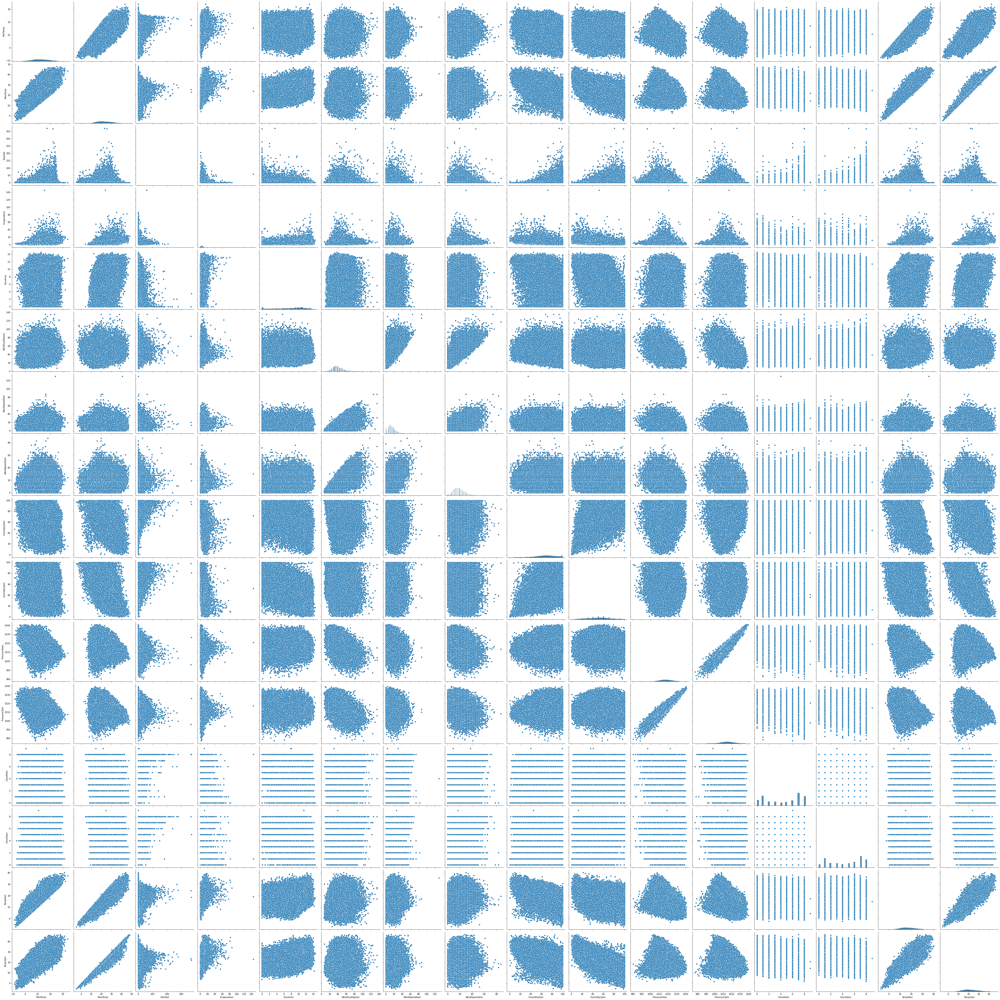

In [3]:
sns.pairplot(weather, height = 4)

<AxesSubplot:>

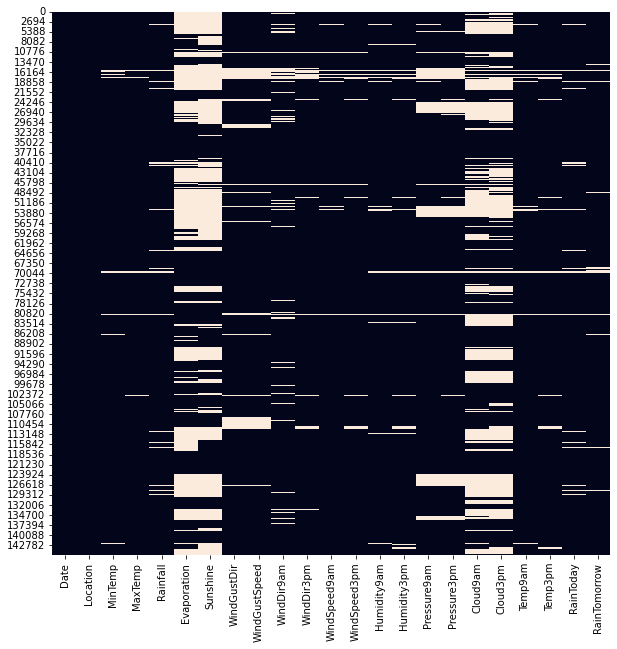

In [4]:
plt.rcParams['figure.figsize']=(10,10)
sns.heatmap(weather.isnull(), cbar=False)


In [5]:
plt.rcParams['figure.figsize']=(10,5)

Above is a quick look at the missing values in the dataset using a heatmap. Ordered by index.

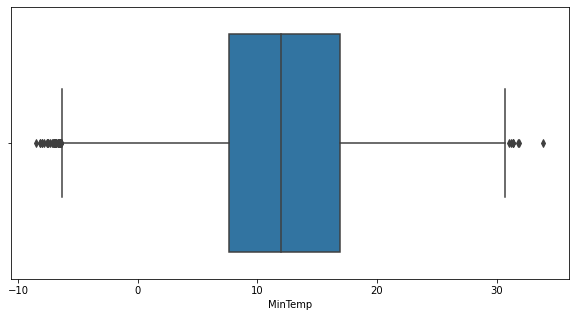

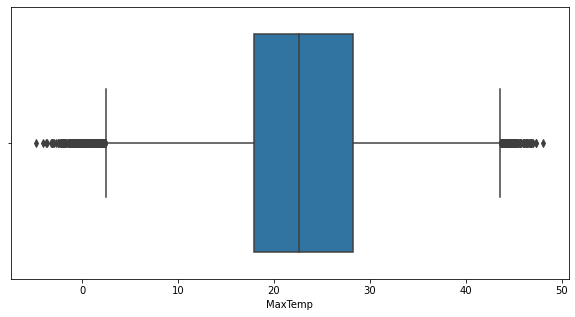

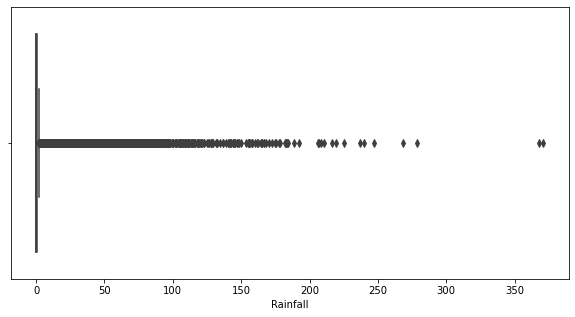

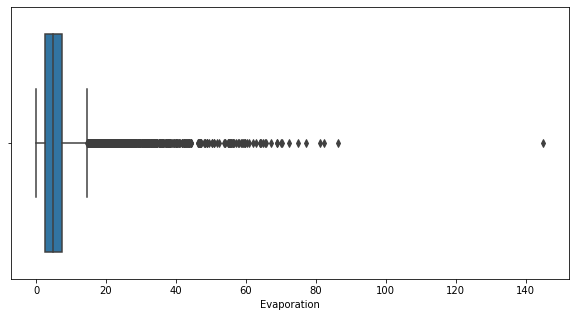

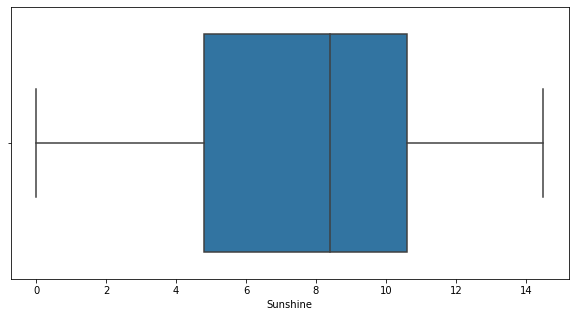

...

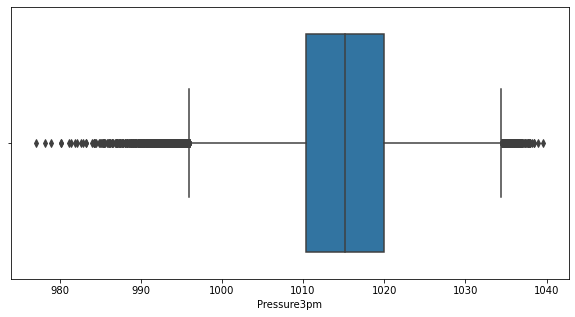

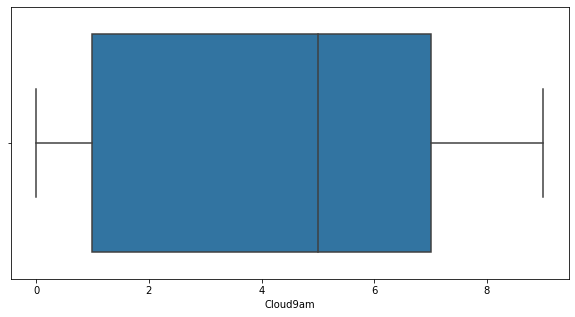

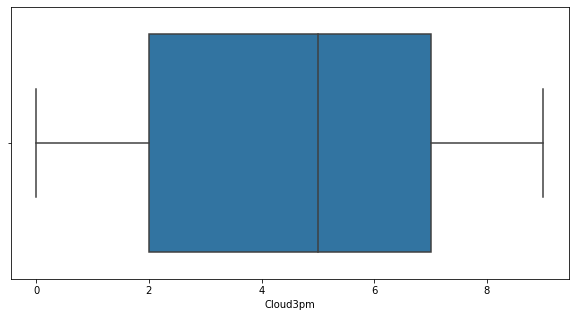

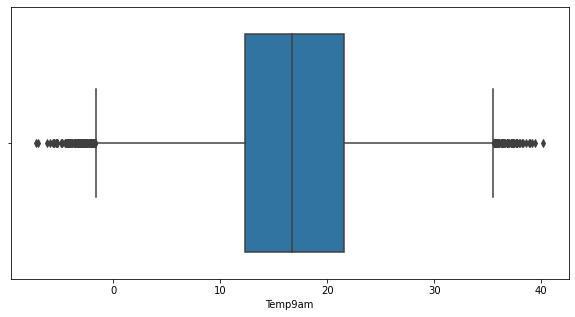

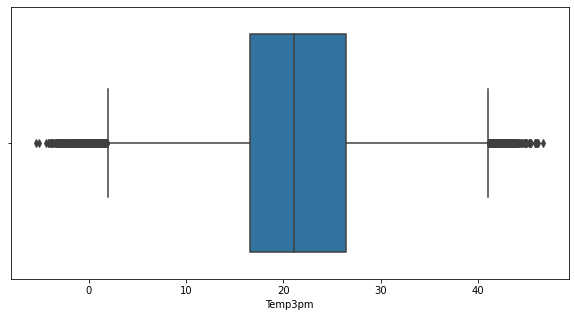

In [6]:
for entry in weather.dropna().columns:
    if(entry in ['Date','Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']): continue
    plt.figure()
    sns.boxplot(x=weather[entry])
plt.show()

Boxplots to show the skewness of some of the features, here we can identify several features that contain lots of zeros or have large outliers.

<AxesSubplot:>

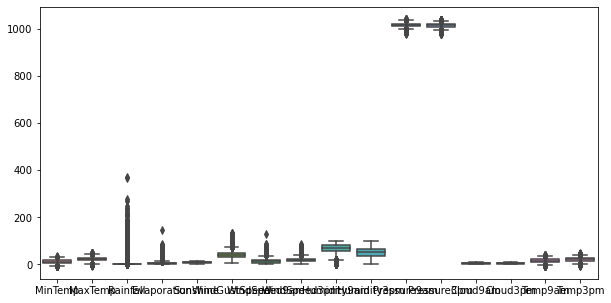

In [7]:
sns.boxplot(data=weather)

### Conversion from string to float

Converted all wind directions into an x and y representation since there is no relative information between N and NW etc to the algorithm, they are just categoricals with no relation to each other.

Also changed the Yes/No format of raintoday and raintomorrow to 0 or 1.

In [8]:
weather = pd.read_csv("/Users/jeandre/Desktop/Data Analytics/weatherAUS.csv")


In [9]:
def f(s):
    if 'W'in s:
        s = s.replace('N','n')
    a=(len(s)-2)/8
    if 'b' in s:
        a = 1/8 if len(s)==3 else 1/4
        return (1-a)*f(s[:-2])+a*f(s[-1])
    else:
        if len(s)==1:
            return 'NESWn'.find(s)*90
        else:
            return (f(s[0])+f(s[1:]))/2

directions = ["N","NNE","NE","ENE",
             "E","ESE","SE","SSE",
             "S","SSW","SW","WSW",
             "W","WNW","NW","NNW",]
values = []
for entry in directions:
    x = np.sin(np.deg2rad(f(entry)))
    y = np.cos(np.deg2rad(f(entry)))
    values.append((x,y))


mydict = dict(zip(directions,values))
print(mydict['NE'])

def newdirection(row):
    if(isinstance(row,str)):
        return mydict[row]
    elif(math.isnan(row)):
        return (math.nan,math.nan)
    

pm =  weather['WindDir3pm'].apply((newdirection))
tuples_as_df = pd.DataFrame(list(pm), columns=['X3pm','Y3pm'])
weather = weather.join(tuples_as_df)

am =  weather['WindDir9am'].apply((newdirection))
tuples_as_df = pd.DataFrame(list(am), columns=['X9am','Y9am'])
weather = weather.join(tuples_as_df)

gust =  weather['WindGustDir'].apply((newdirection))
tuples_as_df = pd.DataFrame(list(gust), columns=['XGust','YGust'])
weather = weather.join(tuples_as_df)

#pm = pd.get_dummies(weather['WindDir3pm'], prefix='3pm')
#am = pd.get_dummies(weather['WindDir9am'], prefix='9am')
#gust = pd.get_dummies(weather['WindGustDir'], prefix='Gust')
#weather = weather.join([pm,am,gust])

del weather['WindDir3pm']
del weather['WindDir9am']
del weather['WindGustDir']

weather.replace(('Yes', 'No'), (1, 0), inplace=True)
weather.tail()

(0.7071067811865475, 0.7071067811865476)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,...,Temp9am,Temp3pm,RainToday,RainTomorrow,X3pm,Y3pm,X9am,Y9am,XGust,YGust
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,31.0,13.0,11.0,...,10.1,22.4,0.0,0.0,0.92388,0.382683,0.707107,-0.707107,1.000000,6.123234e-17
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,22.0,13.0,9.0,...,10.9,24.5,0.0,0.0,0.00000,1.000000,0.707107,-0.707107,-0.382683,9.238795e-01
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,37.0,9.0,9.0,...,12.5,26.1,0.0,0.0,-0.92388,0.382683,0.707107,-0.707107,0.000000,1.000000e+00
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,28.0,13.0,7.0,...,15.1,26.0,0.0,0.0,0.00000,1.000000,0.382683,-0.923880,0.707107,-7.071068e-01
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,17.0,17.0,...,15.0,20.9,0.0,NaN,0.92388,-0.382683,0.923880,-0.382683,NaN,NaN


In [10]:
cols = weather.columns.to_list()
cols = cols[:18]+cols[20:]+cols[18:20]
print(cols)
weather = weather[cols]
#weather = weather.fillna(0)
weather = weather.dropna()
len(cols)

['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'X3pm', 'Y3pm', 'X9am', 'Y9am', 'XGust', 'YGust', 'RainToday', 'RainTomorrow']


26

In the end only a few columns were chosen, this is due to some columns having high correlation with each other eg.(Temps) and therefore only one of the columns needed to be taken as information, this brings down the dimensionality of the data and subsequently makes it easier for the SOM to represent the data.

### Normalisation

The numerical data being fed to a SOM should be normalised, this happens below:

In [11]:
Xs = weather.iloc[:,2:7]
Xs = weather[['MaxTemp','Rainfall','Evaporation','Sunshine','Pressure3pm','Cloud3pm','RainToday']]
Y = weather.iloc[:,-1]
Y = Y.astype(int)
Y = Y.to_numpy()
sc = MinMaxScaler(feature_range=(0,1))
X = sc.fit_transform(Xs)
pd.DataFrame(Xs)
Xs

,MaxTemp,Rainfall,Evaporation,Sunshine,Pressure3pm,Cloud3pm,RainToday
6049,35.2,0.0,12.0,12.3,1004.4,5.0,0.0
6050,28.9,0.0,14.8,13.0,1012.1,1.0,0.0
6052,37.6,0.0,10.8,10.6,1009.2,6.0,0.0
6053,38.4,0.0,11.4,12.2,1009.1,5.0,0.0
6054,41.0,0.0,11.2,8.4,1007.4,6.0,0.0
...,...,...,...,...,...,...,...
142298,33.4,0.0,6.0,11.0,1010.5,1.0,0.0
142299,32.6,0.0,7.6,8.6,1011.2,0.0,0.0
142300,32.8,0.0,5.6,11.0,1011.8,0.0,0.0
142301,31.8,0.0,6.2,10.6,1010.7,1.0,0.0


### SOM

In [103]:
som_grid_rows = 2
som_grid_columns = 2
som_shape = (2,2)
iterations = 5000
sigma = 0.5
learning_rate = 0.3


som = MiniSom(x = som_grid_rows, y = som_grid_columns, input_len=7, sigma=sigma, learning_rate=learning_rate,neighborhood_function='gaussian',random_seed=29)
#som.random_weights_init(X)
som.train(X, iterations,verbose=True)


 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.31048824315463985


### SOM Visualisation

In order to evaluate SOM performance quantization error was used, higher grid values lead to lower quantisation errors, but at the cost of processing time and complexity of the clusters. Amount of clusters = rows x columns


wts = som.weights
wts.shape

In [104]:
plt.rcParams['figure.figsize']=(10,10)

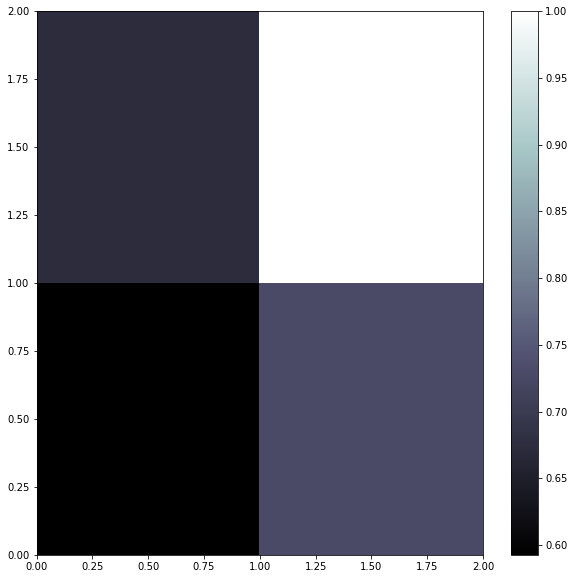

In [105]:
bone()
pcolor(som.distance_map().T)
colorbar()
show()

In [106]:

winner_coordinates = np.array([som.winner(x) for x in X]).T
cluster_index = np.ravel_multi_index(winner_coordinates, som_shape)

The clusters look terrible, but this plot is based only in 2 dimensions rather than all the dimensions that went into training the SOM.

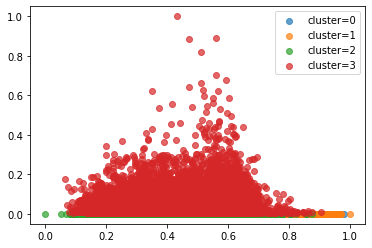

In [107]:
%matplotlib inline

# plotting the clusters using the first 2 dimentions of the data
for c in np.unique(cluster_index):
    plt.scatter(X[cluster_index == c, 0],
                X[cluster_index == c, 1], label='cluster='+str(c), alpha=.7)

plt.legend();

In [108]:
weather['cluster'] = cluster_index

In [109]:
group0 = weather[weather['cluster']==0]
group1 = weather[weather['cluster']==1]
group2 = weather[weather['cluster']==2]
group3 = weather[weather['cluster']==3]

### Discussion

The first thing to look at is the target variable RainTomorrow, its clear that the clusters 2 and 3 contain the overwhelming majority of entrys where RainTomorrow is true.

<AxesSubplot:xlabel='cluster', ylabel='RainTomorrow'>

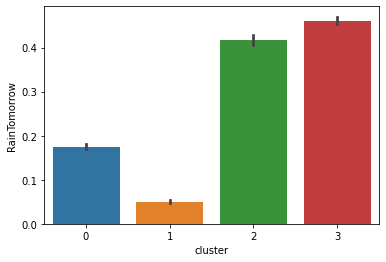

In [110]:
sns.barplot(data=weather,x='cluster',y='RainTomorrow')

For ease of explanation the plotting of the rest of the varibales was plotted in two sections:

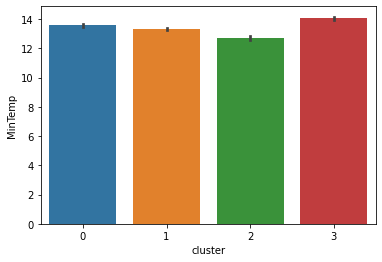

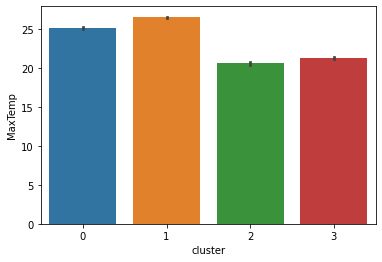

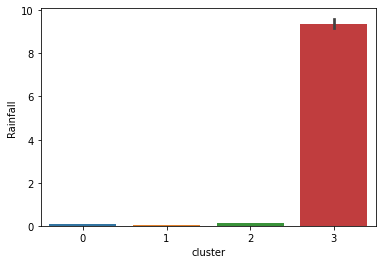

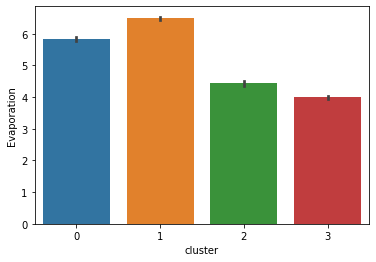

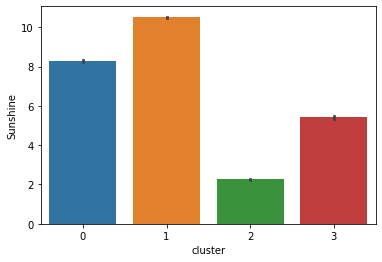

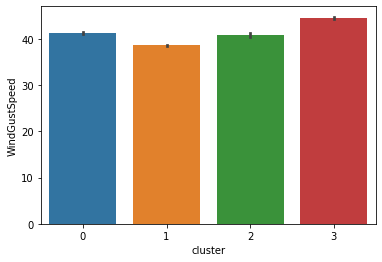

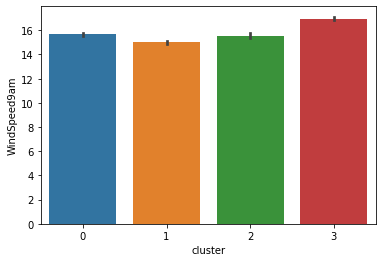

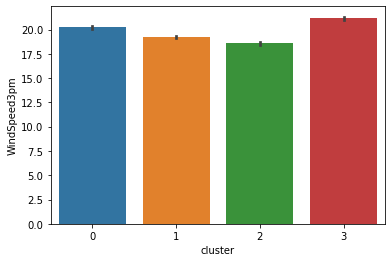

In [111]:
for col in cols[:10]:
    if(col in ['Date','Location']):
        continue
    sns.barplot(data=weather,x='cluster',y=col)
    plt.show()


The most obvious standout here is Rainfall, where cluster 3 has almost all of the heavy rainy days within itself.  
Clusters 2 and 3 have a significant less amount of sunshine than clusters 0 and 1, most likely due to the rain occuring in the entrys for clusters 2 and 3.

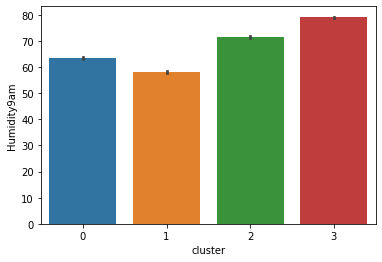

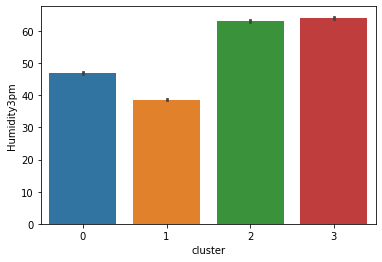

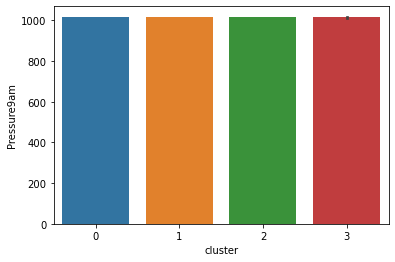

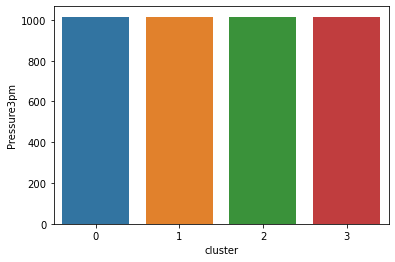

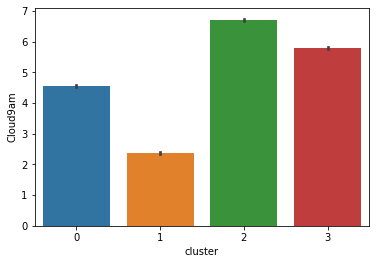

...

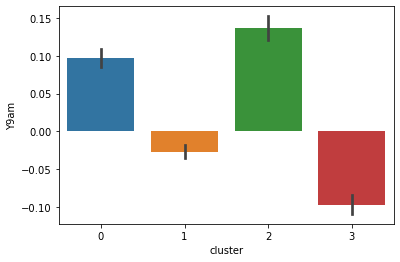

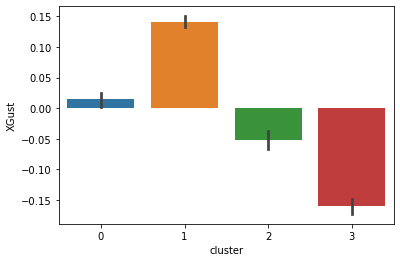

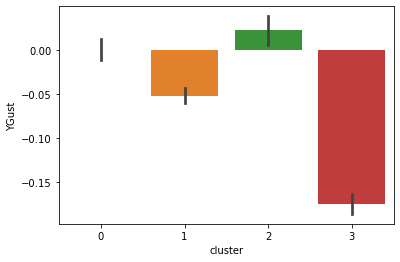

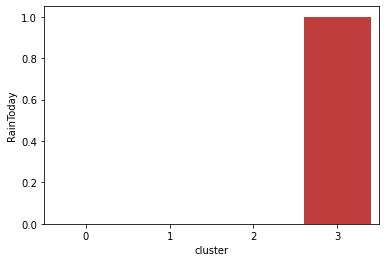

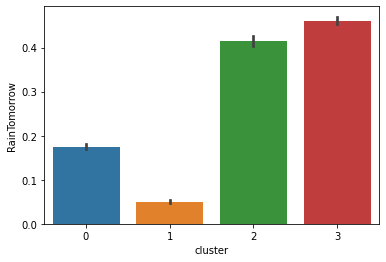

In [112]:
for col in cols[10:]:
    sns.barplot(data=weather,x='cluster',y=col)
    plt.show()

Of great interest is the wind vectors, these were changed from their cardinal representation into X and Y representation. These were also excluded from the training of the SOM. However the clusters 2 and 3 have predominantly the negative X (West) although cluster 3 has much more of a westerly component than 2.  
Clusters 0 and 1 have the more easterly components to their wind. Is it then possible that cluster 3 with a more SW leaning wind while also having more rainfall means that it is the South Westerly wind that brings rain?

There are several redundant features due to their high correlation with other features, such as the temperature features. Pressure appears to be completely irreleveant when it comes to prediciting rainfall the next day in this dataset.